## SENEKAL

--------------------------------------------------------
### DESCRIPTIVE ANALYSIS



The #Senekal protests erupted in the small town of Senekal, the magistracy of a rural farming district in eastern Free State, after the brutal murder of Brendin Horner, a white farm manager, whose body was found on 2 October 2020. His murder quickly fed into a pre-existing discourse about the targeted killing of white farmers by people of colour, and a perceived lack of government intervention. AfriForum, a lobby group that mobilises around white Afrikaner interests, quickly labeled Horner’s murder, which came to stand as an exemplar of farm murders in general, as “an act of terrorism.” 


#### Data Source


Data is extracted from Twitter's API matching the following search query: "Senekal eff", "Brendin Horner" and "senekal protest", for the period: 1 October 2020 to 31 May 2021. 



--------
Number of Daily Tweets in #Senekal Discourse:



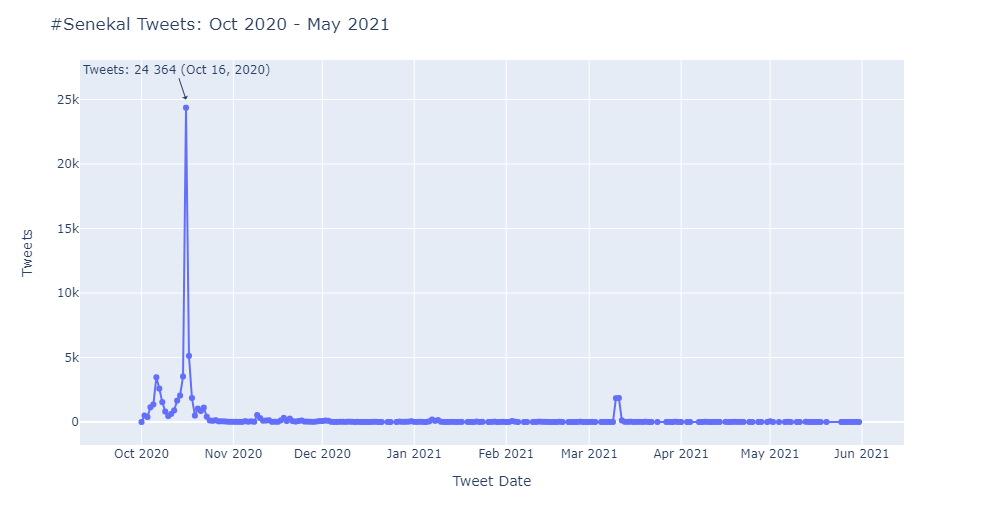

In [1]:
#
#import import_ipynb
#import os
import pandas as pd
import numpy as np
from scipy import stats
import igraph as ig
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import random
from numpy import random as nprando
from datetime import datetime, date, time, timedelta
from IPython.display import Image, SVG, display
#import cairosvg
from svglib.svglib import svg2rlg
from reportlab.graphics import renderPM

######################################################################################### 

##SETUP##
pth='C:/Users/User/Dropbox/Kaplan/sna-kc/Notebook/Senekal/'
sns.set()
nprando.seed(111)
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (12, 8)})
pd.set_option("display.max_columns",None)

##VARIABLES##
e_tweet = "Senekal_2021-06-07.csv"
e_node = "senekal_nodes_1.csv"
e_edge = "senekal_edges_1.csv"

######################################################################################### 
##LOAD TWEET DATA##
df_Tweet = pd.read_csv(e_tweet, usecols=['tweet_id', 'date'], dtype={'userid': str})
df_Tweet['created'] = list(map(lambda x:datetime.strptime(x, "%Y-%m-%dT%H:%M:%S.%fZ").strftime('%Y-%m-%d'), df_Tweet['date']))
df_Tweet = df_Tweet.loc[df_Tweet['created']>= '2020-09-30']
df_Tweet['no_tweets']=df_Tweet.groupby(['created'])['created'].transform('count')
df_Tweet.drop(["tweet_id", "date"], axis=1, inplace=True)
df_Tweet.drop_duplicates(subset="created", keep='first',inplace=True)
df_Tweet = df_Tweet.sort_values(by='created')
#df_Tweet

#plt.rcParams["figure.figsize"]=[10,5]
#plt.rcParams["figure.autolayout"] =True
#fig = px.line(df_Tweet, x='created',y='no_tweets', markers=True)
#fig.update_layout(xaxis_title= 'Tweet Date', yaxis_title= 'Tweets',  title = '#Senekal Tweets: Oct 2020 - May 2021')
#fig.add_annotation(x='2020-10-16', y=25000, text="Tweets: 24 364 (Oct 16, 2020)", showarrow=True, arrowhead=1)
#plt.savefig("senekal_tweets.png")
#fig.show()

print("\n" + "--------" + "\n" + '\033[1m' + 'Number of Daily Tweets in #Senekal Discourse:' + '\033[0m' + "\n")
Image(filename="senekal_tweets_1.png",  width = "650")



#### Data Transformation


Though the extracted dataset consists of all tweets, retweets and replies to tweets related to this topic, this analysis is purely focused on direct engagements and interactions (tweets and tweet replies) between users. To construct this type of network, I only include data where a user tweets a reply (sender) to a user whose tweet was replied to (receiver).

To ensure that the transformed data still reflects the full discourse and no significant information is lost as a result of the conversion from full network to reply network, aggregate statistics that track tweet and retweet data are derived from the extracted dataset. In this way, the properties of the #Senekal full network are still described in the the #Senekal reply network. See below for a list of derived variables before transformation. 

- **Derived node variables**:
   
    >- *#tweeted* -> A measure of the total number of tweets by a user in the #Senekal network.
   
    >- *#retweeted* -> A measure of the total number of tweets by a user that are retweeted by other users in the #Senekal network.
   
    >- *#liked* -> A measure of the total number of tweets by a user that are liked by other users in the #Senekal network. 


- **Derived edge variables**

    >- *weight* -> This captures the total number of replies from a sender to a receiver in the #Senekal network. For example, replying to a user only once gives a weight = 1, but replying to a user multiple times gives a weight = number of replies to that user.

Once variables are derived, the extracted dataset is converted to a directed network, which I call the #Senekal Full Network.

- **#Senekal Full Network**

    The #Senekal full network consists of 65488 tweets (incl. retweets, and replies to tweets) with 24154 active users behind those tweets.

    >- Number of users: 24154

    >- Number of tweets: 65488
    
After dropping all tweets and retweets that do not have a reply, the #Senekal Full Network is then converted to the #Senekal Reply Network.

- **#Senekal Reply Network**

    The #Senekal reply network includes data on users replying to tweets and users whose tweets are being replied to. This is a weighted network where weights measure the frequency of interaction, i.e. the number of times a user replies to the same users tweets.

    >- Number of users: 3432

    >- Number of replies: 4317
    
Next, I exclude all disconnected components and focus my analysis on the #Senekal Reply Network - Largest Connected Component. This sub-network is found by extracting the component with the largest number of connected nodes in the network. To explain, a connected component is a network or subnetwork where every node is atleast connected to one other node, i.e. there must exist a path such that any two nodes can be connected starting from point *A* to point *B*. 

- **#Senekal Reply Network - Largest Connected Component**

    The #Senekal reply network has 524 connected components. In this network, the largest connected component has 2207 nodes and 3011 edges, and the second largest connected component has 14 nodes and 16 edges. 

    >- Number of users: 2207

    >- Number of replies: 3285
 

#### Method



Using pythons iGraph library, I describe the #Senekal Reply Network - Largest Connected Component in terms of its **centrality** and **connectivity and cohesion** properties. 

In [2]:
#
#LOAD NODE DATA##
df_node_1 = pd.read_csv(e_node, sep=";", dtype={'id': str})
df_node_1 = df_node_1.rename(columns={"user_followers_count": "followers", 'user_following_count':"following","user_tweet_count":"tweets","user_listed_count":"listed","no_#tweeted":"#tweeted","no_#retweeted":"#retweeted","no_#liked":"#liked"})
#print("\n" + '\033[1m' + 'Nodelist Description:' + '\033[0m' + "\n")
#print(df_node_1.info())
#print("\n" + "--------" + "\n" + '\033[1m' + 'Nodelist Summary Statistics:' + '\033[0m' + "\n")
#print("--------")
#print(df_node_1.describe())

##LOAD EDGE DATA##
df_edge_1 = pd.read_csv(e_edge, sep=";", usecols=['source', 'target', 'weight'], dtype={'source': str, 'target': str, 'weight':int})
#print("\n" + '\033[1m' + 'Edgelist Description:' + '\033[0m' + "\n")
#print(df_edge_1.info())
#print("\n" + "--------" + "\n" + '\033[1m' + 'Edgelist Summary Statistics:' + '\033[0m' + "\n")
#print("--------")
#print(df_edge_1.describe())
#print(df_edge_1['weight'].sum())

# CONVERT TO DIRECTED IGRAPH
G_ig=ig.Graph.DictList(df_node_1.to_dict('records'), df_edge_1.to_dict('records'), directed=True, vertex_name_attr='id', edge_foreign_keys=('source', 'target'))
print("\n" + "--------" + "\n" + '\033[1m' + 'Directed Network:' + '\033[0m' + "\n")
print(ig.summary(G_ig))


--------
Directed Network:

IGRAPH DNW- 2207 3011 -- 
+ attr: #liked (v), #retweeted (v), #tweeted (v), date_tweet (v), datetime_tweet (v), followers (v), following (v), id (v), label (v), listed (v), month_tweet (v), name (v), node_type (v), tweets (v), source (e), target (e), weight (e)
None


------------------------------------------------------------------
#### 1. CENTRALITY


#### 1.1. Node Centrality

To identify key or "important" node's, I determine the centrality of a node relative to other nodes in a network.
	

In [3]:
#
#DESCRIPTIVE ANALYSIS##
#Node Centrality Measures

d_lst = G_ig.strength(weights='weight',mode='all')
id_lst = G_ig.strength(weights='weight',mode='in')
od_lst = G_ig.strength(weights='weight',mode='out')
cl_lst = G_ig.closeness(weights='weight',mode='all')
bw_lst = G_ig.betweenness(weights='weight',directed=True)
pg_lst = G_ig.pagerank(weights='weight',directed=True)
ec_lst = G_ig.eccentricity(mode='all')

G_ig.vs['degree'] = d_lst
G_ig.vs['indegree'] = id_lst
G_ig.vs['outdegree'] = od_lst
G_ig.vs['closeness'] = cl_lst
G_ig.vs['betweenness'] = bw_lst
G_ig.vs['pagerank'] = pg_lst
G_ig.vs['eccentricity'] = ec_lst

df_attr = G_ig.get_vertex_dataframe()
print("\n" + "--------" + "\n" + '\033[1m' + 'Node Centrality: Summary Statistics' + '\033[0m')
print("------------------------"+ "\n" )
print(df_attr.loc[:,['indegree', 'outdegree', 'closeness', 'betweenness', 'pagerank', 'eccentricity']].describe())



--------
Node Centrality: Summary Statistics
------------------------

          indegree    outdegree    closeness  betweenness     pagerank  \
count  2207.000000  2207.000000  2207.000000  2207.000000  2207.000000   
mean      1.488446     1.488446     0.157815    64.975189     0.000453   
std       4.566893     2.855500     0.026996   488.335670     0.001296   
min       0.000000     0.000000     0.074709     0.000000     0.000156   
25%       0.000000     1.000000     0.140242     0.000000     0.000156   
50%       1.000000     1.000000     0.157865     0.000000     0.000194   
75%       1.000000     1.000000     0.176128     1.000000     0.000347   
max      99.000000    91.000000     0.252403  8503.500000     0.033209   

       eccentricity  
count   2207.000000  
mean      12.830086  
std        1.314416  
min       10.000000  
25%       12.000000  
50%       13.000000  
75%       13.000000  
max       19.000000  



--------
Maximum Indegree:

EFFSouthAfrica


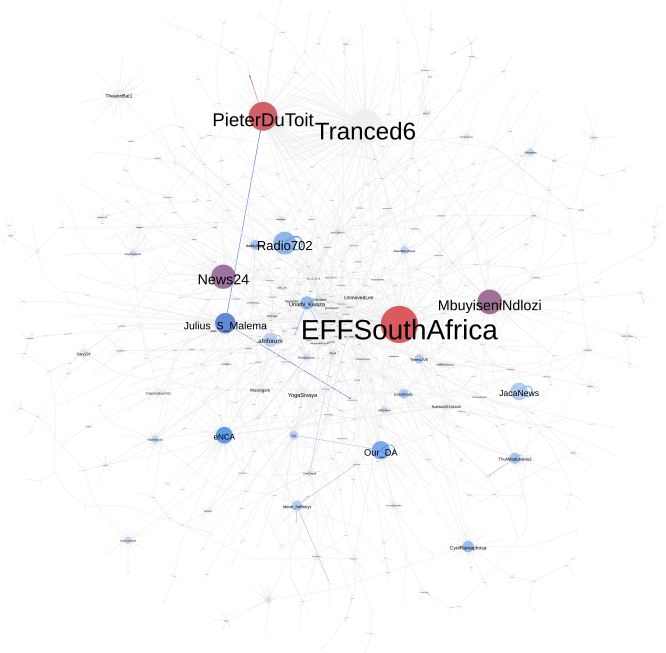

In [4]:
#
df_ind=df_attr.loc[df_attr['indegree']==df_attr['indegree'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Indegree:' + '\033[0m' + "\n")
#print(df_ind.loc[:,['label']].reset_index(drop=True))
print(list(df_ind['label'])[0])

#display(SVG(filename="senekal_feat_ind_1.svg"))
display(SVG(filename="senekal_feat_ind_1.svg"))


--------
Maximum Outdegree:

Tranced6


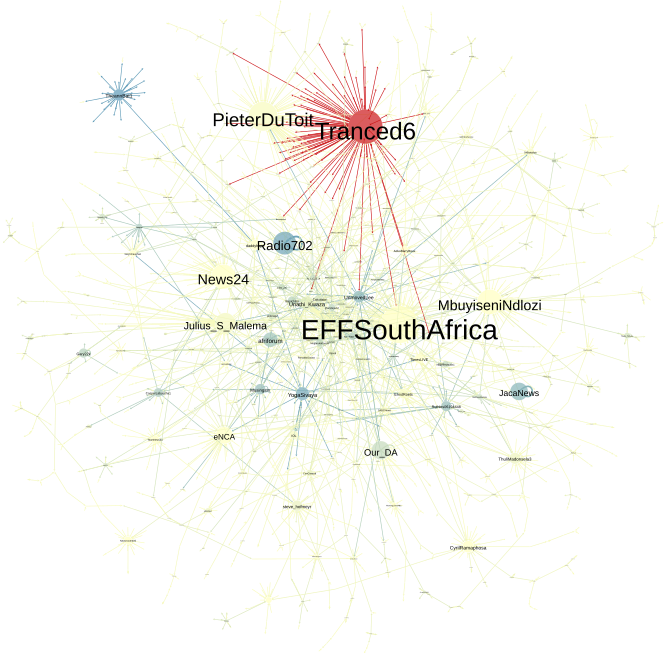

In [5]:
#
df_out=df_attr.loc[df_attr['outdegree']==df_attr['outdegree'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Outdegree:' + '\033[0m' + "\n")
#print(df_out.loc[:,['label']].reset_index(drop=True))
print(list(df_out['label'])[0])
display(SVG(filename="senekal_feat_out_1.svg"))


--------
Maximum Closeness:

EFFSouthAfrica


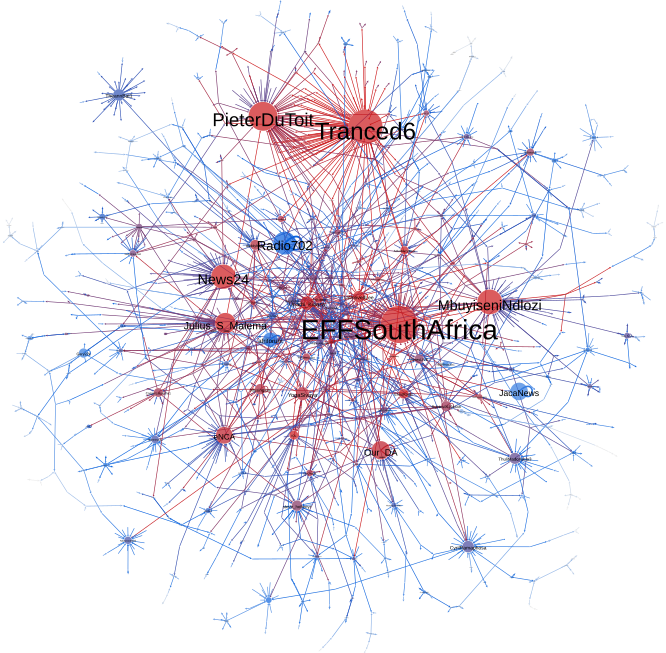

In [6]:
#
df_cls=df_attr.loc[df_attr['closeness']==df_attr['closeness'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Closeness:' + '\033[0m' + "\n")
#print(df_cls.loc[:,['label']].reset_index(drop=True))
print(list(df_cls['label'])[0])
display(SVG(filename="senekal_feat_cls_1.svg"))


--------
Maximum Betweeness:

N_I_C_S_A


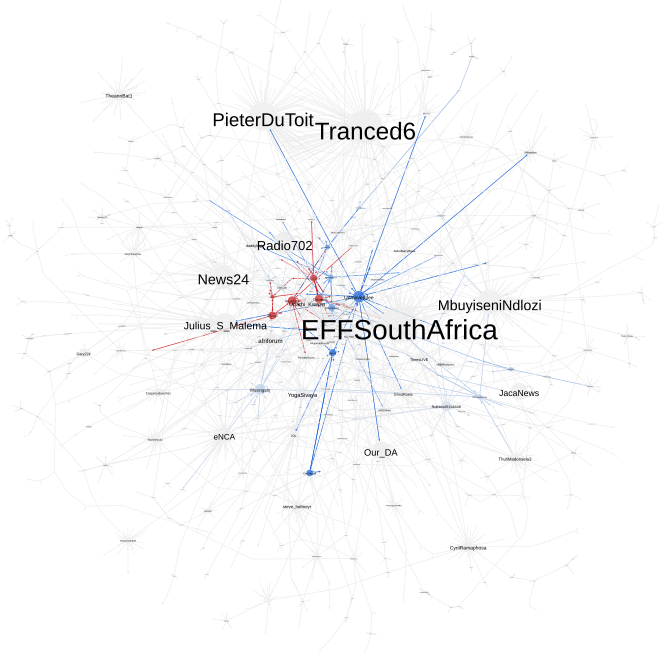

In [7]:
#
df_btw=df_attr.loc[df_attr['betweenness']==df_attr['betweenness'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Betweeness:' + '\033[0m' + "\n")
#print(df_btw.loc[:,['label']].reset_index(drop=True))
print(list(df_btw['label'])[0])
display(SVG(filename="senekal_feat_btw_1.svg"))


--------
Maximum PageRank:

Our_DA


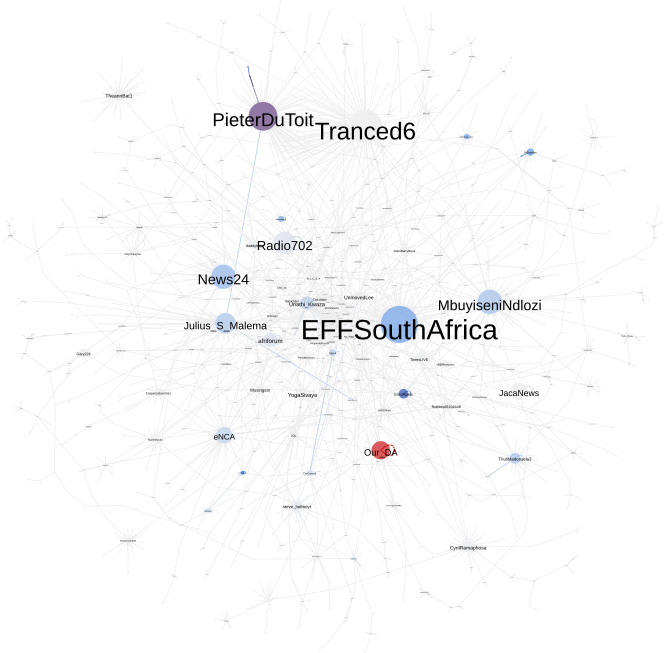

In [8]:
#
df_pgr=df_attr.loc[df_attr['pagerank']==df_attr['pagerank'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum PageRank:' + '\033[0m' + "\n")
#print(df_pgr.loc[:,['label']].reset_index(drop=True))
print(list(df_pgr['label'])[0])
display(SVG(filename="senekal_feat_pgr_1.svg"))


--------
Minimum Eccentricity:

             label
0   EFFSouthAfrica
1       UnmovedLee
2       ErnstRoets
3         Tranced6
4  citrusramaphosa
5           EFF_FS
6       xeshamusiq


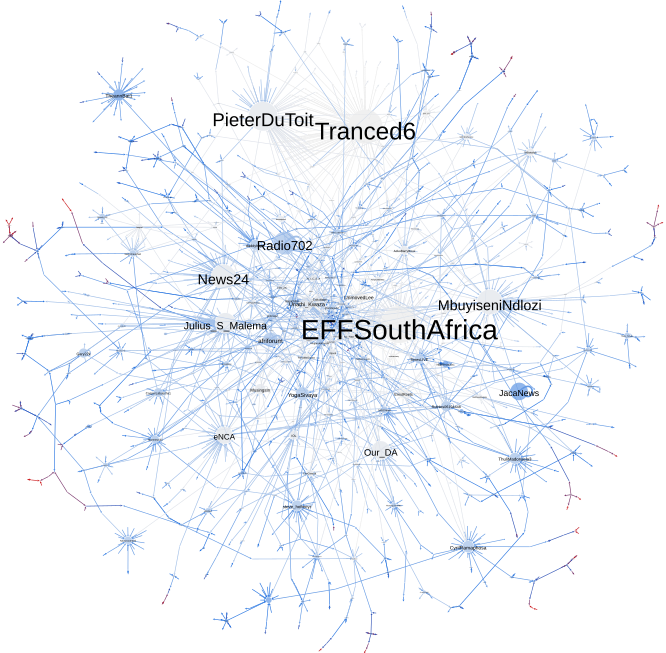

In [9]:

df_ecc=df_attr.loc[df_attr['eccentricity']==df_attr['eccentricity'].min()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Minimum Eccentricity:' + '\033[0m' + "\n")
print(df_ecc.loc[:,['label']].reset_index(drop=True))
#print(list(df_ecc['label']))
display(SVG(filename="senekal_feat_ecc_1.svg"))

#### 1.2. Network Centrality



To determine relationships between nodes and their position in the network, I measure a node's ties relative to the ties present in the network and the distribution of ties throughout the network.


--------
Network Centrality: Summary Statitics
------------------------


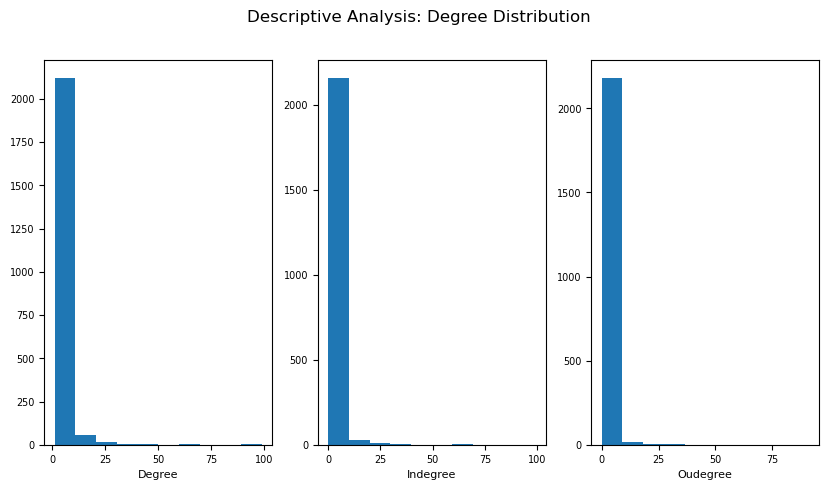

In [10]:
#
# Plot degree distribution
print("\n" + "--------" + "\n" + '\033[1m' + 'Network Centrality: Summary Statitics' + '\033[0m')
print("------------------------")
#print("\n" + "--------" + "\n" + '\033[1m' + 'Degree Distribution:' + '\033[0m')
def plot_degree_hist(G):
    deg_lst = [G.strength(n,weights='weight',mode='all') for n in G.vs()]
    indeg_lst = [G.strength(n,weights='weight',mode='in') for n in G.vs()]
    outdeg_lst = [G.strength(n,weights='weight',mode='out') for n in G.vs()]

    plt.rcParams["figure.figsize"]=[10,5]
    #plt.rcParams["figure.autolayout"] =True

    plt.subplot(1,3,1)
    plt.hist(deg_lst)
    plt.xlabel('Degree', fontsize=8)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.subplot(1,3,2)
    plt.hist(indeg_lst)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.xlabel('Indegree', fontsize=8)
    plt.subplot(1,3,3)
    plt.xticks(fontsize=7)
    plt.yticks(fontsize=7)
    plt.hist(outdeg_lst)
    plt.xlabel('Oudegree', fontsize=8)


    plt.suptitle('Descriptive Analysis: Degree Distribution')
    #plt.savefig("{}".format(gpath) + x + "_degree_hist_wr.png")
    plt.show()

plot_degree_hist(G_ig)

In [11]:
#Find network degree
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Degree:' + '\033[0m')
deg_lst = [G_ig.strength(n,weights='weight',mode='all') for n in G_ig.vs()]
np.mean(deg_lst)


--------
Average Degree:


2.976891708201178

In [12]:
#Find network density
print("\n" + "--------" + "\n" + '\033[1m' + 'Density:' + '\033[0m')
G_ig.density()


--------
Density:


0.0006184476081831443

In [13]:
#Find network path length
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Path Length:' + '\033[0m')
G_ig.average_path_length(directed=True)


--------
Average Path Length:


6.034344711335862

------------------------------------------------
#### 2. CONNECTIVITY AND COHESION 


To examine how tightly connected or clustered the network is, I examine the direction, frequency and consistency of relations between nodes and the nodes in their neighbourhood.

In [14]:
#
# Find Ego Network
# This function limits the network to a given node's neighborhood (defined n-steps away) and then runs the triad census on that neighborhood.	
ego_triad_lst=[]
ego_dyad_lst=[] 

def find_ego_triad(G, nodes, steps=2):
    #print(G.vs[0]["id"])
    for n in nodes:
        ego_lst = G.neighborhood(vertices=n, order=steps, mode='out', mindist=0)
        G_ego = G.induced_subgraph(vertices=ego_lst, implementation="auto")
        ego_triad = G_ego.triad_census()
        ego_triad_lst.append(list(ego_triad))

    return ego_triad_lst

ego_step_3 = find_ego_triad(G_ig, G_ig.vs, steps=3)
triads = ["003", "012", "102", "021D", "021U", "021C", "111D", "111U", "030T", "030C", "201", "120D", "120U", "120C", "210C", "300"]

for i in range(0,len(triads)):
    G_ig.vs["triad_"+"{}".format(i)] = [ego[i] for ego in ego_step_3]
  
   
def find_ego_dyad(G, nodes, steps=2):
    #print(G.vs[0]["id"])
    for n in nodes:
        ego_lst = G.neighborhood(vertices=n, order=steps, mode='out', mindist=0)
        G_ego = G.induced_subgraph(vertices=ego_lst, implementation="auto")
        ego_dyad = G_ego.dyad_census()
        ego_dyad_lst.append(list(ego_dyad))

    return ego_dyad_lst

ego_dyad_3 = find_ego_dyad(G_ig, G_ig.vs, steps=3)
#G_ig.vs["003"] = [d["003"] for i in ego_step_3 for d in i.items()]
dyads = ["mutual", "asymmetric", "null"]

for i in range(0,len(dyads)):
    G_ig.vs[dyads[i]] = [ego[i] for ego in ego_dyad_3]

df_attr = G_ig.get_vertex_dataframe()
df_attr["reciprocity"] = df_attr['triad_2']+df_attr['triad_10']+df_attr['triad_15']
df_attr["transitivity"] = df_attr['triad_8']+df_attr['triad_11']+df_attr['triad_12']+df_attr['triad_15']
df_attr["hierarchy"] = df_attr['triad_3']+df_attr['triad_4']+df_attr['triad_8']+df_attr['triad_11']+df_attr['triad_12']
df_attr["mutual"] = df_attr['mutual']
df_attr["asymmetric"] = df_attr['asymmetric']
df_attr["null"] = df_attr['null']
    
print("\n" + "--------" + "\n" + '\033[1m' + 'Connectivity and Cohesion: Summary Statistics' + '\033[0m')
print("------------------------"+ "\n" )
print(df_attr.loc[:,["reciprocity","transitivity","hierarchy"]].describe())

df_attr.to_csv("senekal_features_1.csv", sep=";",encoding='utf-8',  index=False)



--------
Connectivity and Cohesion: Summary Statistics
------------------------

       reciprocity  transitivity    hierarchy
count  2207.000000   2207.000000  2207.000000
mean     16.019937      0.043951     7.169461
std     110.518569      0.360528   117.516320
min       0.000000      0.000000     0.000000
25%       0.000000      0.000000     0.000000
50%       0.000000      0.000000     0.000000
75%       2.000000      0.000000     1.000000
max    4463.000000     10.000000  5441.000000



--------
Maximum Reciprocity:

Tranced6


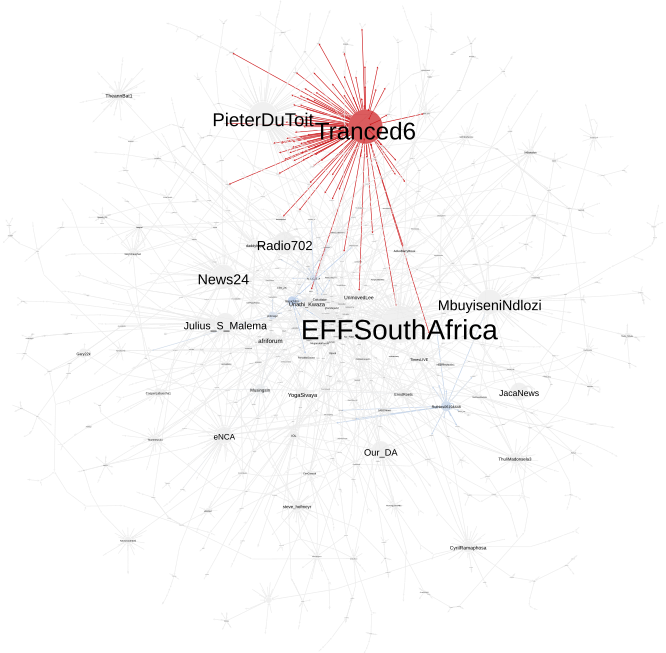

In [15]:
#
df_rcp=df_attr.loc[df_attr['reciprocity']==df_attr['reciprocity'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Reciprocity:' + '\033[0m' + "\n")
#print(df_rcp.loc[:,['label']].reset_index(drop=True))
print(list(df_rcp['label'])[0])

#df_mtl=df_attr.loc[df_attr['mutual']==df_attr['mutual'].max()]
#print("\n" + "--------" + "\n" + '\033[1m' + 'Mutual:' + '\033[0m' + "\n")
#print(df_mtl.loc[:,['id','label']].reset_index(drop=True))
display(SVG(filename="senekal_feat_rcp_1.svg"))


--------
Maximum Transitivity:

Laagvat


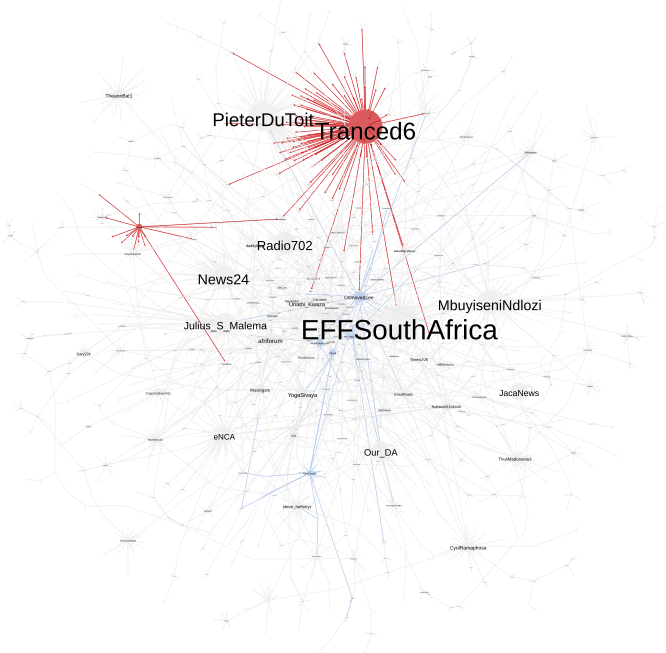

In [16]:
#
df_trs=df_attr.loc[df_attr['transitivity']==df_attr['transitivity'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Transitivity:' + '\033[0m' + "\n")
#print(df_trs.loc[:,['label']].reset_index(drop=True))
print(list(df_trs['label'])[0])
display(SVG(filename="senekal_feat_trs_1.svg"))


--------
Maximum Hierarchy:

Tranced6


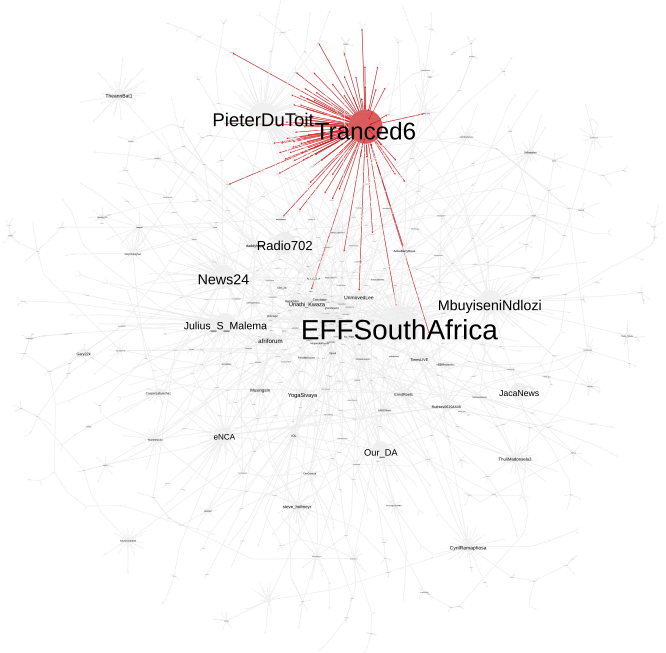

In [17]:
#
df_hrc=df_attr.loc[df_attr['hierarchy']==df_attr['hierarchy'].max()]

print("\n" + "--------" + "\n" + '\033[1m' + 'Maximum Hierarchy:' + '\033[0m' + "\n")
#print(df_hrc.loc[:,['label']].reset_index(drop=True))
print(list(df_hrc['label'])[0])
display(SVG(filename="senekal_feat_hrc_1.svg"))

In [18]:
#Find network clustering
#print("\n" + "--------" + "\n" + '\033[1m' + 'Clustering Coefficient:' + '\033[0m')
#G_ig.transitivity_undirected()
#0.0036255767963085037

#Find network average clustering
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Clustering Coefficient:' + '\033[0m')
G_ig.transitivity_avglocal_undirected()
#random compare of network same size and connectivityavg deg/no. nodes = 0.0014 (probability of any given link - in random process prob that ij are present when ik and jk are present is simply probability that ik is present = avg deg/no.nodes) 


--------
Average Clustering Coefficient:


0.025795904313428337

---------------------------------------------------
#### 3. EVALUATION


To determine if the current network exhibits small world properties, I simulate multiple random networks and compare the average distances and clustering features of either network.


In [19]:
data = list()
avg_clust = list()
avg_path = list()
for i in range(1,101):
    G_rando = ig.Graph.Erdos_Renyi(n=2207, m=3011,  directed=True, loops=True)
    
    path = G_rando.average_path_length(directed=True)
    clust = G_rando.transitivity_avglocal_undirected()
    
    avg_path.append(path)
    avg_clust.append(clust)
    
#print(len([i for i in G_rando.es]))

In [20]:
print("\n" + "------------------------" + "\n" + '\033[1m' + 'Random Network:' + '\033[0m')
print("------------------------")

print("\n" + "--------" + "\n" + '\033[1m' + 'Average Path Length:' + '\033[0m')
sum(avg_path)/len(avg_path)


------------------------
Random Network:
------------------------

--------
Average Path Length:


17.444414592912388

In [21]:
print("\n" + "--------" + "\n" + '\033[1m' + 'Average Clustering Coefficient:' + '\033[0m')
sum(avg_clust)/len(avg_clust)


--------
Average Clustering Coefficient:


0.001129543262162485

-----------------------------------------------------
#### 4. SUMMARY




In this section, I perform descriptive analysis on the #Senekal twitter reply network to determine certain node features and network properties that identify significant players in the discourse. I summarise a few findings below.

In addition to skewed or unequal degree distributions, which indicates a tendency of preferential attachment toward popular users, this network exhibits high clustering (20.9x higher) and small average distances (2.9x smaller) than randomly simulated networks of the same size. Consistent with the impression of small worlds. 

Twitter accounts found to rank highly on certain network measures are listed below:

- **EFFSouthAfrica** (Indegree, Closeness) 


- **Our_DA** (PageRank) 


- **N_I_C_S_A** (Betweenness)


- **Tranced6** (Outdegree, Reciprocity, Hierarchy)


- **Laagvat** (Transitivity)

Given **Tranced6**'s high rank in measures of *outdegree*, *reciprocity*, *transitivity*, and *hierarchy*, it is likely the case that users forming part of **Tranced6**'s neighbourhood strongly prefer communicating with members of the same neighbourhood as compared to others. Usually this is a sign that discussions are potentially "echo chamber's" where opposite or contradicting views never enter the discussion or are easily dismissed. Surprisingly, upon further inspection into the real targets of **Tranced6**'s replies, the theory of the "echo chamber" weakens. This is because majority of replies are in response to tweets sent by users with opposing views, aiming to counter and discredit them. Replies to these users are often a copy and paste of the same message: "EFF tried to go to where the farmers were allocated and destroyed government property." Still, it is plausible that although **Tranced6**'s replies target tweets outside their views, other users in their neighbourhood may choose to only communicate in a close knit clique or "echo chamber" where similar messaging in support of **Tranced6**'s tweets are circulated.



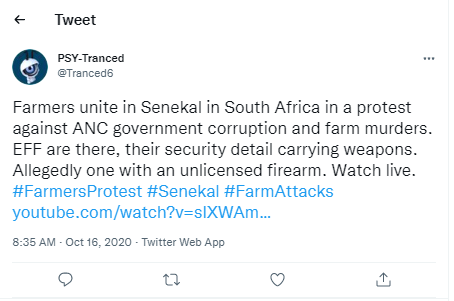

In [22]:
Image(filename="Senekal_Tranced6_1.png",  width = "350")

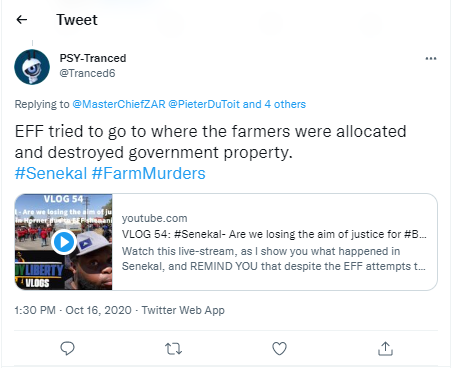

In [23]:
Image(filename="Senekal_Tranced6_2.png",  width = "350")

In the next section, I explore the network further by using community detection methods to identify groups (communities) of users that are densely connected and have high levels of interaction within the discourse.